<a href="https://colab.research.google.com/github/vposwalia/Recommendation-System-In-Spotify-by-Machine-Learning/blob/main/spotify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [46]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

In [47]:
data = pd.read_csv("/data.csv")
genre_data = pd.read_csv('/data_by_genres.csv')
year_data = pd.read_csv('/data_by_year.csv')

In [48]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [49]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [50]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [72]:
# Check for missing values in each dataset
missing_values_data = data.isnull().sum()
missing_values_genre_data = genre_data.isnull().sum()
missing_values_year_data = year_data.isnull().sum()

# Display the count of missing values in each dataset
print("Missing values in 'data' dataset:")
print(missing_values_data)
print("\nMissing values in 'genre_data' dataset:")
print(missing_values_genre_data)
print("\nMissing values in 'year_data' dataset:")
print(missing_values_year_data)

Missing values in 'data' dataset:
valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
decade              0
cluster_label       0
dtype: int64

Missing values in 'genre_data' dataset:
mode                0
genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
cluster             0
dtype: int64

Missing values in 'year_data' dataset:
mode                0
year                0
acousticness        0
d

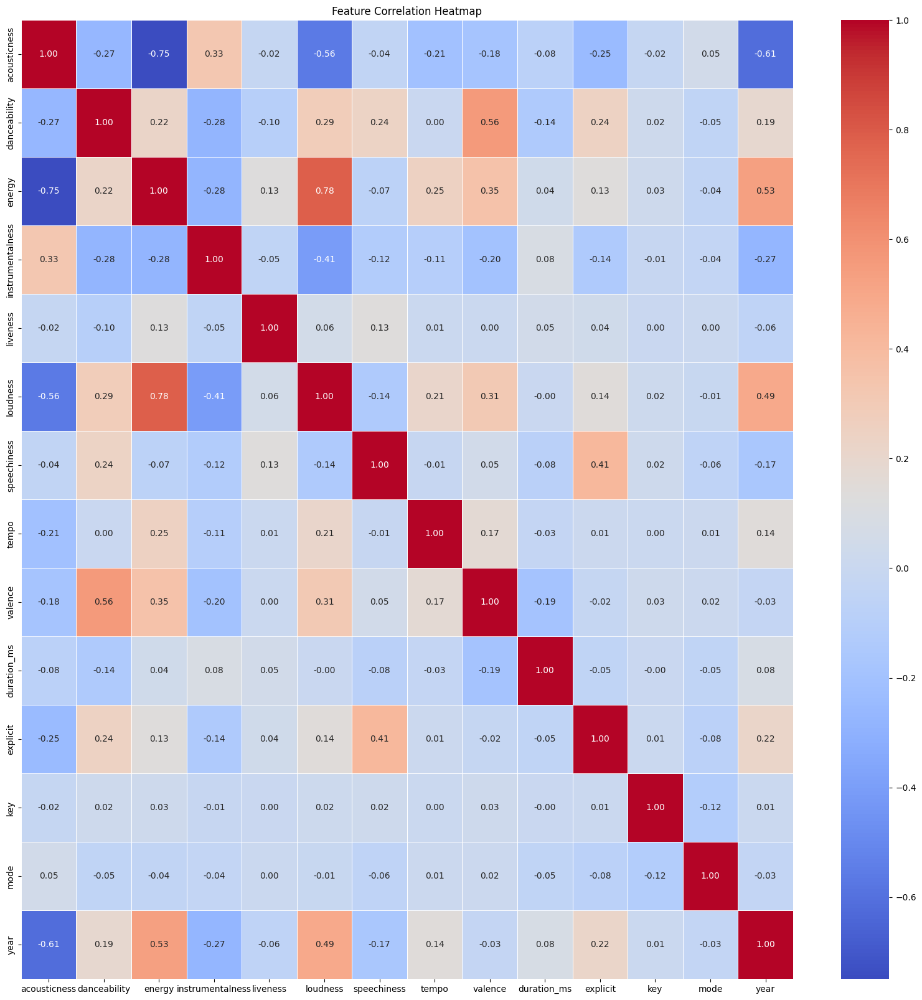

In [51]:
#we are using heatmap to visualize correlations.
#using seaborn and matplot
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
                 'liveness', 'loudness', 'speechiness', 'tempo', 'valence',
                 'duration_ms', 'explicit', 'key', 'mode', 'year']

X, y = data[feature_names], data['popularity']

# Calculate the correlation matrix
correlation_matrix = X.corr()

# Plot the heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Feature Correlation Heatmap')
plt.show()


In [52]:
#Understanding by visualization
#we are creating a new decade column and then visualizing the count of songs per decade using Seaborn countplot

<ipython-input-53-036469d72d59>:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




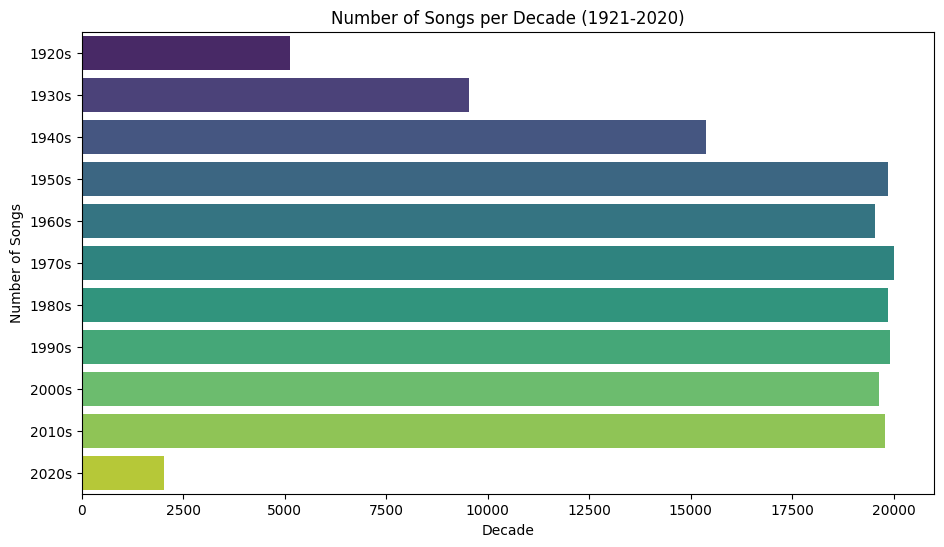

In [53]:
# Function to get the decade from the year
def get_decade(year):
    return f"{int(year/10) * 10}s"

# Apply the function to create a new 'decade' column
data['decade'] = data['year'].apply(get_decade)

# Set the figure size
plt.figure(figsize=(11, 6))

# Plot the count of songs per decade
sns.countplot(data['decade'], palette='viridis')

plt.xlabel('Decade')
plt.ylabel('Number of Songs')
plt.title('Number of Songs per Decade (1921-2020)')
plt.show()


In [54]:

sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

fig = px.line(year_data, x='year', y=sound_features,
              labels={'value': 'Sound Feature Value', 'year': 'Year'},
              title='Trends of Sound Features Over the Years',
              color_discrete_sequence=px.colors.qualitative.Set1)

fig.update_layout(
    legend_title_text='Sound Features',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    xaxis=dict(tickmode='linear', tick0=1920, dtick=10),
    yaxis=dict(title_text='Sound Feature Value'),
)

# Show the plot
fig.show()


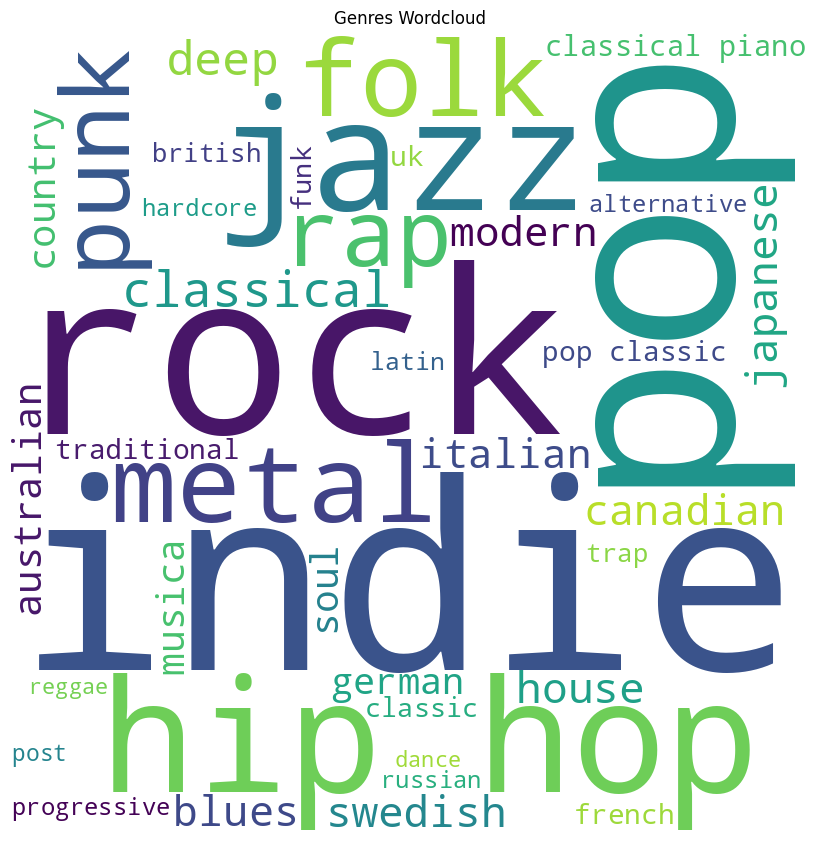

In [73]:
from wordcloud import WordCloud,STOPWORDS

stopwords = set(STOPWORDS)
comment_words = " ".join(genre_data['genres'])+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words=40,
                min_font_size = 10).generate(comment_words)

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Genres Wordcloud")
plt.show()

In [55]:
import plotly.express as px

top10_genres = genre_data.nlargest(10, 'popularity')
#grouped bar chart
fig = px.bar(top10_genres,
             x='genres',
             y=['valence', 'energy', 'danceability', 'acousticness'],
             barmode='group',
             labels={'value': 'Characteristic Value', 'genres': 'Genres'},
             title='Top 10 Genres - Characteristics Comparison',
             color_discrete_sequence=px.colors.qualitative.Dark24)  # Change the color sequence here

fig.update_layout(
    legend_title_text='Characteristics',
    legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1),
    xaxis=dict(title='Genres'),
    yaxis=dict(title='Characteristic Value'),
)

fig.show()


In [75]:
artist_data=pd.read_csv('/data_by_artist.csv')

In [76]:
top10_popular_artists = artist_data.nlargest(10, 'popularity')
top10_most_song_produced_artists = artist_data.nlargest(10, 'count')

In [77]:
print('Top 10 Artists that produced most songs:')
top10_most_song_produced_artists[['count','artists']].sort_values('count',ascending=False)

Top 10 Artists that produced most songs:


,count,artists
8367,3169,Francisco Canaro
28561,2422,Эрнест Хемингуэй
28560,2136,Эрих Мария Ремарк
8434,1459,Frank Sinatra
10714,1256,Ignacio Corsini
27109,1200,Vladimir Horowitz
1682,1146,Arturo Toscanini
2707,1103,Billie Holiday
12378,1061,Johnny Cash
7426,1023,Elvis Presley


In [56]:
#clustering genres with k means

In [57]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

X = genre_data.select_dtypes(np.number)

# Creating pipeline
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
genre_data['cluster'] = cluster_pipeline.fit_predict(X)

#for t-SNE visualization
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)

#DataFrame for the t-SNE projection
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres', 'cluster'],
    title='K-Means Clustering of Genres with t-SNE Visualization')
fig.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.007s...
[t-SNE] Computed neighbors for 2973 samples in 0.336s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106232
[t-SNE] KL divergence after 1000 iterations: 1.392417


In [58]:

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
import pandas as pd
import plotly.express as px
import numpy as np

In [59]:

song_cluster_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=20, verbose=True))
], verbose=True)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

# Visualizing the Clusters with PCA
pca_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('PCA', PCA(n_components=2))
])

song_embedding = pca_pipeline.fit_transform(X)

projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'],
    labels={'x': 'Principal Component 1', 'y': 'Principal Component 2'},
    title='K-Means Clustering of Songs with PCA Visualization',
    color_discrete_sequence=px.colors.qualitative.Set3
)

fig.show()


[Pipeline] ........... (step 1 of 3) Processing imputer, total=   0.1s
[Pipeline] ............ (step 2 of 3) Processing scaler, total=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Initialization complete
Iteration 0, inertia 1504158.6775048254.
Iteration 1, inertia 1220787.481637239.
Iteration 2, inertia 1180601.3615770056.
Iteration 3, inertia 1151214.9909312879.
Iteration 4, inertia 1122722.1001447234.
Iteration 5, inertia 1105349.0035251607.
Iteration 6, inertia 1096206.7372836329.
Iteration 7, inertia 1091392.6993944603.
Iteration 8, inertia 1088382.1230657771.
Iteration 9, inertia 1087212.5691430438.
Iteration 10, inertia 1086406.2653639168.
Iteration 11, inertia 1085615.9764758837.
Iteration 12, inertia 1084682.1631569173.
Iteration 13, inertia 1083589.2694826107.
Iteration 14, inertia 1082294.0951110222.
Iteration 15, inertia 1081254.7277798958.
Iteration 16, inertia 1080641.0346004565.
Iteration 17, inertia 1080201.706705535.
Iteration 18, inertia 1079816.6118137275.
Iteration 19, inertia 1079431.5836870405.
Iteration 20, inertia 1079027.6158413275.
Iteration 21, inertia 1078585.9164994848.
Iteration 22, inertia 1078133.2305754446.
Iteration 23, inertia 

In [60]:
!pip install plotly.express

In [61]:
#recommendation system builder

In [62]:
!pip install spotipy

In [63]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
import os
import pandas as pd

# Set environment variables directly in Python
os.environ["SPOTIPY_CLIENT_ID"] = "025cc591a3aa48cd876c942dbce5a0ec"
os.environ["SPOTIPY_CLIENT_SECRET"] = "69d2219344254b638305de16da473127"

# Create a Spotipy client
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials())

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q='track: {} year: {}'.format(name, year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)


In [64]:
'''
Finds song details from spotify dataset. If song is unavailable in dataset, it returns none.
'''
def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']




In [66]:
'''
Flattenning the dictionary by grouping the key and forming a list of values for respective key.
'''
def flatten_dict_list(dict_list):
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = [] # 'name', 'year'
    for dic in dict_list:
        for key,value in dic.items():
            flattened_dict[key].append(value) # creating list of values
    return flattened_dict


In [67]:
'''
Fetches song details from dataset. If info is unavailable in dataset, it will search details from the spotify dataset.
'''
def get_song_data(song, spotify_data):
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        print('Fetching song information from local dataset')
        return song_data

    except IndexError:
        print('Fetching song information from spotify dataset')
        return find_song(song['name'], song['year'])
'''
Fetches song info from dataset and does the mean of all numerical features of the song-data.
'''
def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))#nd-array where n is number of songs in list. It contains all numerical vals of songs in sep list.
    #print(f'song_matrix {song_matrix}')
    return np.mean(song_matrix, axis=0) # mean of each ele in list, returns 1-d array

In [68]:
'''Gets song list as input.
Get mean vectors of numerical features of the input.
Scale the mean-input as well as dataset numerical features.
calculate eculidean distance b/w mean-input and dataset.
Fetch the top 10 songs with maximum similarity.
'''
def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    #print(f'song_center {song_center}')
    scaler = song_cluster_pipeline.steps[0][1] # StandardScalar()
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    #print(f'distances {distances}')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')


In [69]:
recommend_songs([{'name': 'Blinding Lights', 'year': 2019}],  data)

Fetching song information from spotify dataset


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but SimpleImputer was fitted with feature names



[{'name': 'A Dream Is a Wish Your Heart Makes',
  'year': 2015,
  'artists': "['Lily James']"},
 {'name': 'Six Forty Seven', 'year': 2016, 'artists': "['Instupendo']"},
 {'name': 'I Know You Know I Love You',
  'year': 2011,
  'artists': "['Sunset Rollercoaster']"},
 {'name': 'Find the Cost of Freedom',
  'year': 1974,
  'artists': "['Crosby, Stills, Nash & Young']"},
 {'name': 'no eres tu(soy yo)', 'year': 2020, 'artists': "['Kali Uchis']"},
 {'name': 'Thot Thot', 'year': 2018, 'artists': "['JayDaYoungan']"},
 {'name': 'Lost Files', 'year': 2019, 'artists': "['Polo G']"},
 {'name': 'Boom Boom Boom Boom Boom Boom Boom Boom Boom Boom Boom Boom Boom',
  'year': 2014,
  'artists': "['Dan Bull']"},
 {'name': "I'm Not Enough and I'm Sorry",
  'year': 2018,
  'artists': "['Teqkoi', 'Snøw']"},
 {'name': 'Jellyman Kelly',
  'year': 2003,
  'artists': "['James Taylor', 'The Sesame Street Kids']"}]

In [70]:
recommend_songs([{'name': 'Yeh Sham Mastani (with Dialogues)', 'year':1970}],  data)

Fetching song information from local dataset


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but SimpleImputer was fitted with feature names



[{'name': "There's No You", 'year': 1955, 'artists': "['Miles Davis']"},
 {'name': "Walkin' - Live at Philharmonic Hall, New York, NY - February 1964",
  'year': 1966,
  'artists': "['Miles Davis']"},
 {'name': "If You Don't Know Me By Now",
  'year': 1985,
  'artists': "['Patti LaBelle']"},
 {'name': 'Igbe', 'year': 1973, 'artists': "['Fela Kuti']"},
 {'name': 'Music Is My Way of Life',
  'year': 1982,
  'artists': "['Patti LaBelle']"},
 {'name': 'Your Sweetness Is My Weakness',
  'year': 1978,
  'artists': "['Barry White']"},
 {'name': 'The Treasure - Take One',
  'year': 1972,
  'artists': "['Stephen Stills']"},
 {'name': 'Superwoman', 'year': 1972, 'artists': "['Stevie Wonder']"},
 {'name': 'Look into the Future', 'year': 1976, 'artists': "['Journey']"}]

In [71]:
recommend_songs([{'name': 'Tum Hi Ho', 'year': 2013}],data)

Fetching song information from local dataset


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but SimpleImputer was fitted with feature names



[{'name': 'Sometimes', 'year': 2018, 'artists': "['Goth Babe']"},
 {'name': 'Footsteps', 'year': 2015, 'artists': "['Pop Evil']"},
 {'name': 'Sr. Cobranza', 'year': 1998, 'artists': "['Bersuit Vergarabat']"},
 {'name': 'Good Day', 'year': 2008, 'artists': "['Nappy Roots']"},
 {'name': 'Endless Love (with Mariah Carey)',
  'year': 1994,
  'artists': "['Luther Vandross', 'Mariah Carey']"},
 {'name': 'Corrido De Juanito', 'year': 2017, 'artists': "['Calibre 50']"},
 {'name': 'A New Day Has Come - Radio Remix',
  'year': 2001,
  'artists': "['Céline Dion']"},
 {'name': 'Gostava Tanto De Você', 'year': 1973, 'artists': "['Tim Maia']"},
 {'name': 'Cuéntale', 'year': 2006, 'artists': "['Don Omar']"}]